In [1]:
import numpy as np 
import pandas as pd 
import plotly.express as px
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np
from torchvision import transforms

In [2]:
images = os.listdir('rtsd-frames/rtsd-frames/')
labels = pd.read_csv('df_all_pic.csv')

In [3]:
root_path = 'rtsd-frames/rtsd-frames/'

In [4]:
labels.head()

,filename,x_from,y_from,width,height,sign_class,sign_id
0,autosave01_02_2012_09_13_33.jpg,649,376,18,18,2_1,0
1,autosave01_02_2012_09_13_34.jpg,671,356,20,21,2_1,0
2,autosave01_02_2012_09_13_35.jpg,711,332,27,26,2_1,0
3,autosave01_02_2012_09_13_36.jpg,764,290,37,36,2_1,0
4,autosave01_02_2012_09_13_36.jpg,684,384,17,17,1_23,1


In [5]:
labels.sign_class.unique()

array(['2_1', '1_23', '1_17', '3_24_n40', '8_2_1', '5_20', '3_24_n20',
       '5_19_1', '5_16', '3_25_n20', '6_16', '7_15', '2_2', '2_4',
       '8_13_1', '4_2_1', '1_20_3', '1_25', '3_4_n8', '8_3_2', '3_4_1',
       '4_1_6', '4_2_3', '4_1_1', '1_33', '5_15_5', '3_27', '1_15',
       '4_1_2_1', '6_3_1', '8_1_1', '6_7', '5_15_3', '7_3', '1_19', '6_4',
       '8_1_4', '8_8', '1_16', '1_11_1', '6_6', '5_15_1', '7_2', '5_15_2',
       '7_12', '3_18', '5_6', '5_5', '7_4', '4_1_2', '8_2_2', '7_11',
       '3_24_n5', '1_22', '1_27', '2_3_2', '5_15_2_2', '1_8', '3_13_r5',
       '2_3', '8_3_3', '2_3_3', '7_7', '1_11', '8_13', '3_24_n30',
       '1_12_2', '1_20', '1_12', '3_24_n60', '3_24_n70', '3_24_n50',
       '3_32', '2_5', '3_1', '4_8_2', '3_20', '3_13_r4.5', '3_2', '2_3_6',
       '5_22', '5_18', '2_3_5', '7_5', '8_4_1', '3_13_r3.7', '3_14_r3.7',
       '1_2', '1_20_2', '4_1_4', '7_6', '8_1_3', '8_3_1', '4_3', '4_1_5',
       '8_2_3', '8_2_4', '3_24_n80', '1_31', '3_10', '4_2_2', '3_13_r2

In [6]:
labels.sign_class.describe()

count     104358
unique       198
top       5_19_1
freq       24264
Name: sign_class, dtype: object

In [7]:
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_24' if '3_24_n40' in str(x) or '3_24_n20' in str(x) or '3_24_n30' in str(x) or '3_24_n10' in str(x) or '3_24_n80' in str(x) or '3_24_n60' in str(x) or '3_24_n70' in str(x)   or '3_24_n5' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '6_2' if '6_2_n50' in str(x) or '6_2_n60' in str(x) or '6_2_n70' in str(x) or '6_2_n20' in str(x) or '6_2_n40' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_25' if '3_25_n20' in str(x)  or '3_25_n80' in str(x) or '3_25_n50' in str(x) or '3_25_n40' in str(x) or '3_25_n70' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_4' if '3_4_n8' in str(x)  or '3_4_n2' in str(x) or '3_4_n5' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_13' if '3_13_r4.1' in str(x)  or '3_13_r3.5' in str(x) or '3_13_r3.3' in str(x) or '3_13_r3' in str(x) or '3_13_r4' in str(x) or '3_13_r3.9' in str(x) or '3_13_r2.5' in str(x) or '3_13_r3.7' in str(x) or '3_13_r5.2' in str(x) or '3_13_r5' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_12' if '3_12_n10' in str(x) or '3_12_n3' in str(x) or '3_12_n5' in str(x) or '3_12_n6' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_11' if '3_11_n8' in str(x) or '3_11_n17' in str(x) or '3_11_n13'  in str(x) or '3_11_n5' in str(x) or '3_11_n9' in str(x) or '3_11_n20' in str(x) or '3_11_n23' in str(x) else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_14' if '3_14_r3.5' in str(x) or '3_14_r2.7' in str(x) or '3_14_r3' in str(x)  else x)
labels['sign_class'] = labels['sign_class'].apply(lambda x: '3_16' if '3_16_n3' in str(x) or '3_16_n1' in str(x) else x)


In [8]:
labels['sign_class'].value_counts()

5_19_1    24264
2_1       10961
5_16       5172
5_15_2     4944
3_24       4104
          ...  
8_23          3
8_3_3         2
4_5           2
3_33          1
2_3_5         1
Name: sign_class, Length: 155, dtype: int64

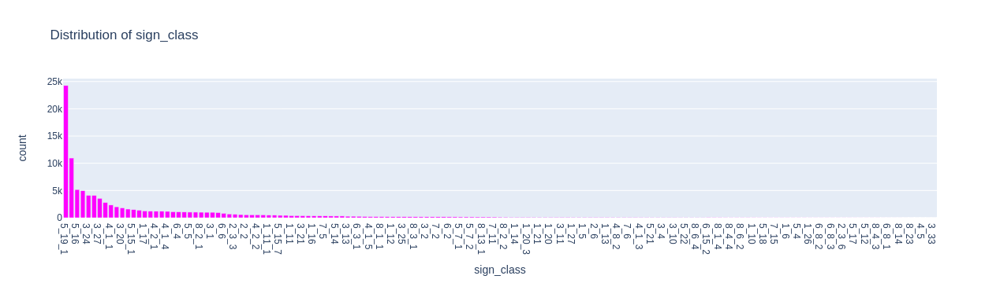

In [9]:
grouped_data = labels.groupby('sign_class').size().reset_index(name='count')
grouped_data = grouped_data.sort_values(by='count', ascending=False)
fig = px.bar(grouped_data, x='sign_class' ,y ='count', labels={'sign_class': 'sign_class'}, color_discrete_sequence=['magenta'], title=f'Distribution of sign_class')
fig.show()

In [10]:
grouped_data.describe()

,count
count,155.000000
mean,673.277419
std,2259.578916
min,1.000000
25%,34.000000
50%,126.000000
75%,434.500000
max,24264.000000


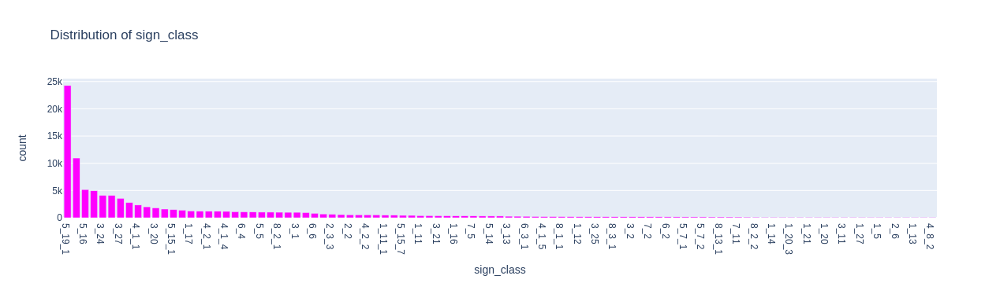

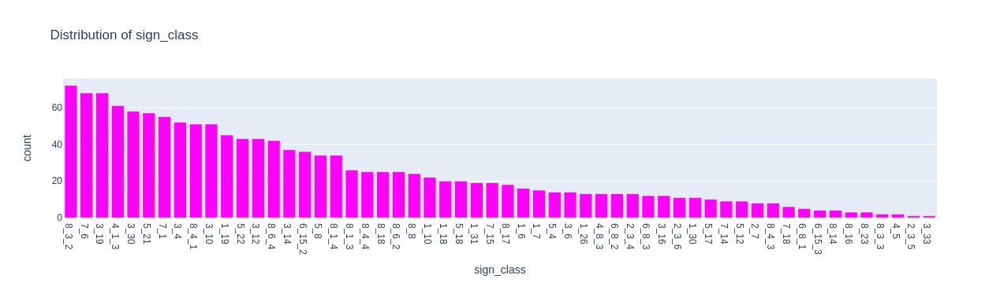

In [11]:
grouped_data_1 = grouped_data.head(99)
grouped_data_2 = grouped_data[99:198]
fig = px.bar(grouped_data_1, x='sign_class', y='count', title=f'Distribution of sign_class', color_discrete_sequence=['magenta'])
fig.show()
fig = px.bar(grouped_data_2, x='sign_class', y='count', title=f'Distribution of sign_class', color_discrete_sequence=['magenta'])
fig.show()

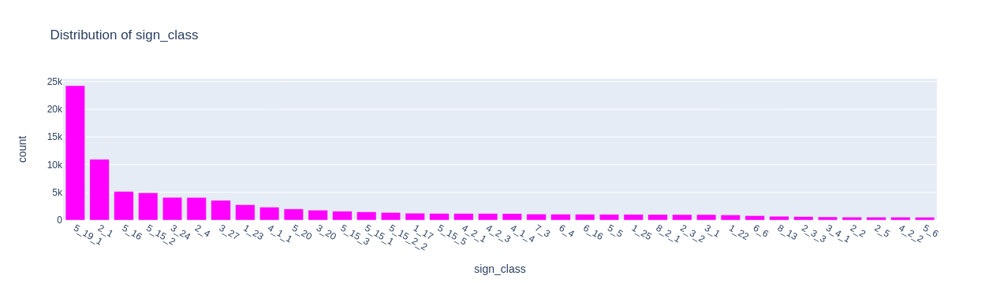

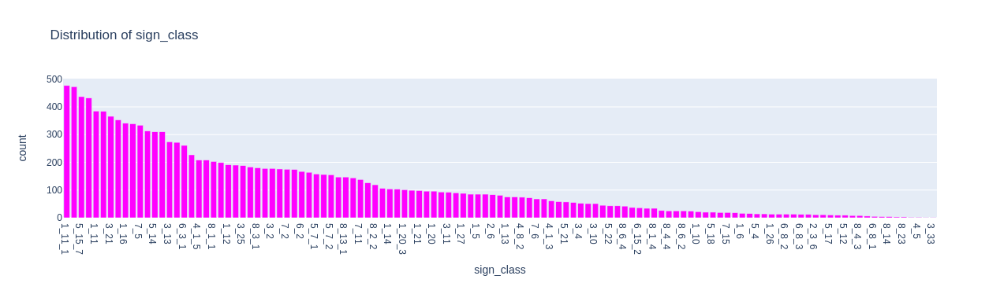

In [12]:
grouped_data_2 = grouped_data[grouped_data['count'] < 527]
grouped_data_1 = grouped_data[grouped_data['count'] >= 527]
fig = px.bar(grouped_data_1, x='sign_class', y='count', title=f'Distribution of sign_class', color_discrete_sequence=['magenta'])
fig.show()
fig = px.bar(grouped_data_2, x='sign_class', y='count', title=f'Distribution of sign_class', color_discrete_sequence=['magenta'])
fig.show()

In [13]:
def make_marking(id):
    im_labels = labels.iloc[id]
    im = Image.open(root_path + im_labels.filename)

    fig, ax = plt.subplots()
    fig.set_size_inches(18.5, 10.5)
    ax.imshow(im)
    rect = patches.Rectangle((im_labels.x_from, im_labels.y_from), im_labels.width, im_labels.height, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

    plt.show()

In [14]:
grouped_data_small_ds = grouped_data[grouped_data['count'] <= 3]

In [15]:
files_index_list = []
for i in grouped_data_small_ds.sign_class:
    files_index = labels.index[labels['sign_class'] == i]
    files_index_list.append(files_index)

In [16]:
files_index_list

[Int64Index([86729, 86731, 86733], dtype='int64'),
 Int64Index([102416, 102419, 102422], dtype='int64'),
 Int64Index([1282, 1313], dtype='int64'),
 Int64Index([17829, 17830], dtype='int64'),
 Int64Index([2697], dtype='int64'),
 Int64Index([38169], dtype='int64')]

8_16
autosave23_10_2012_10_00_46_0.jpg


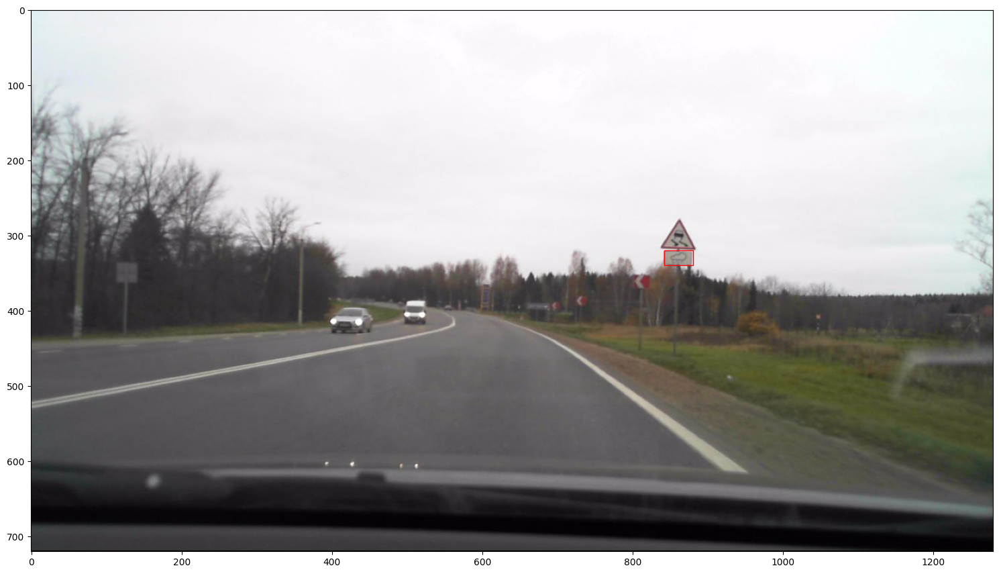

8_23
autosave24_10_2013_11_29_00_0.jpg


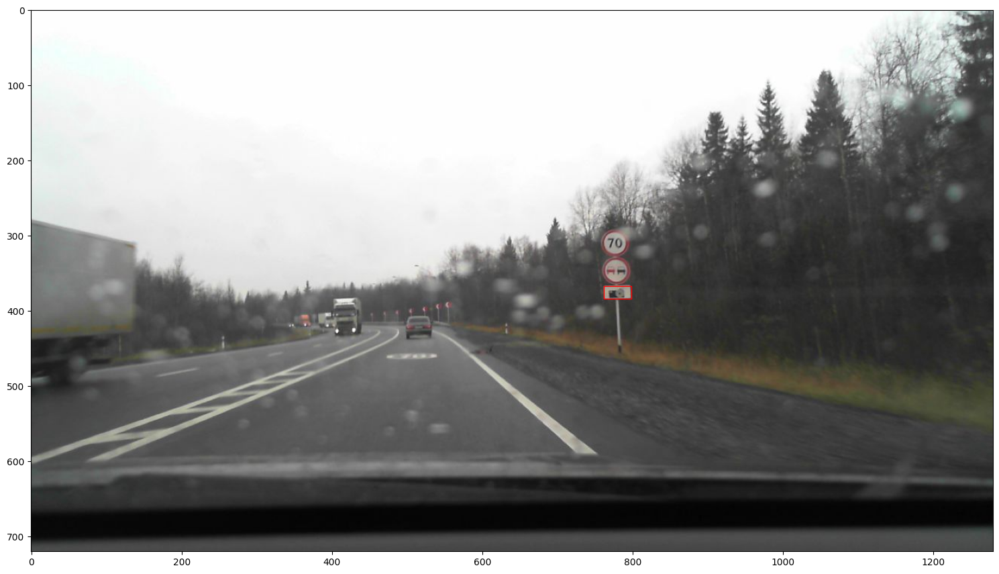

8_3_3
autosave01_02_2012_10_11_31.jpg


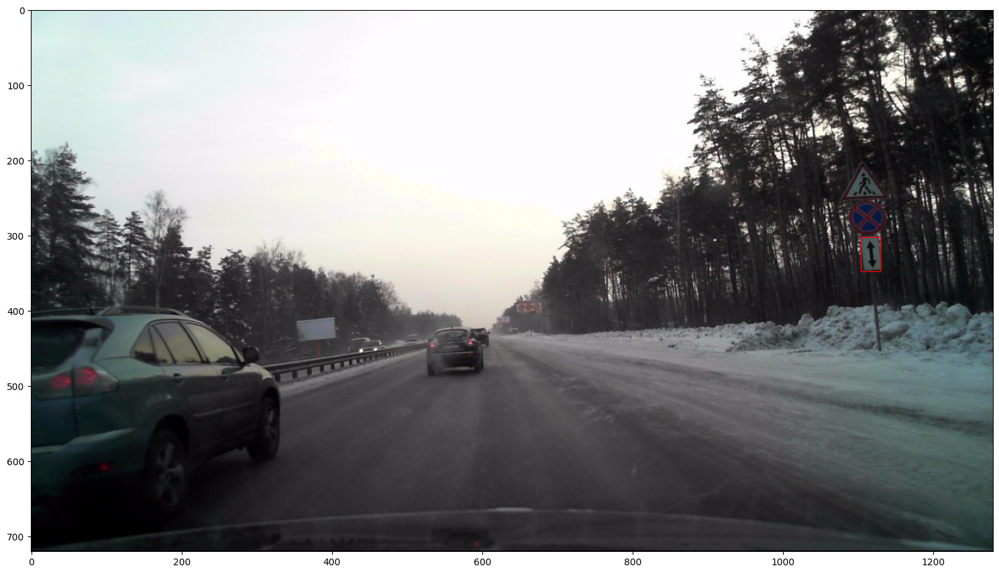

4_5
autosave09_10_2012_12_42_29_0.jpg


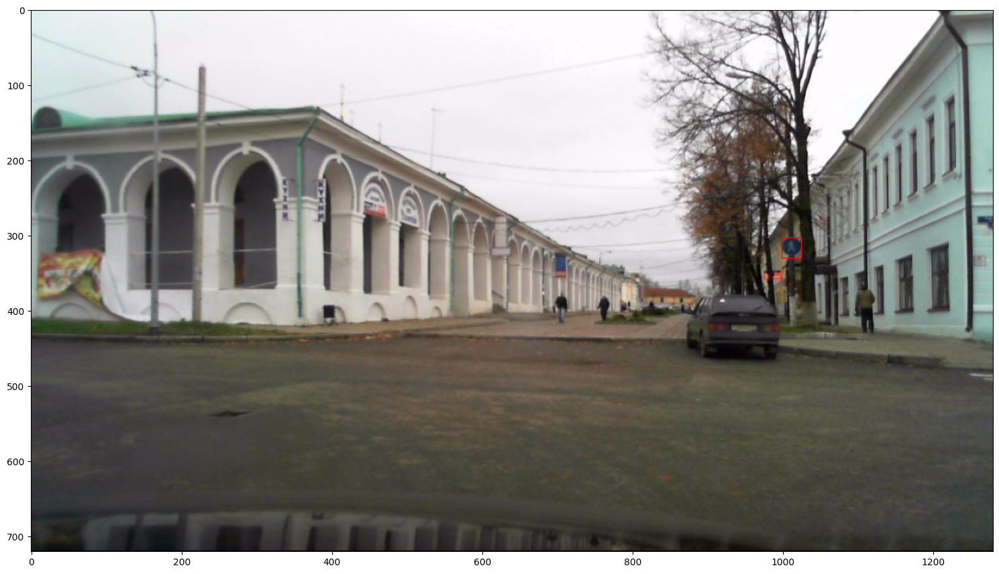

2_3_5
autosave01_02_2012_11_57_49.jpg


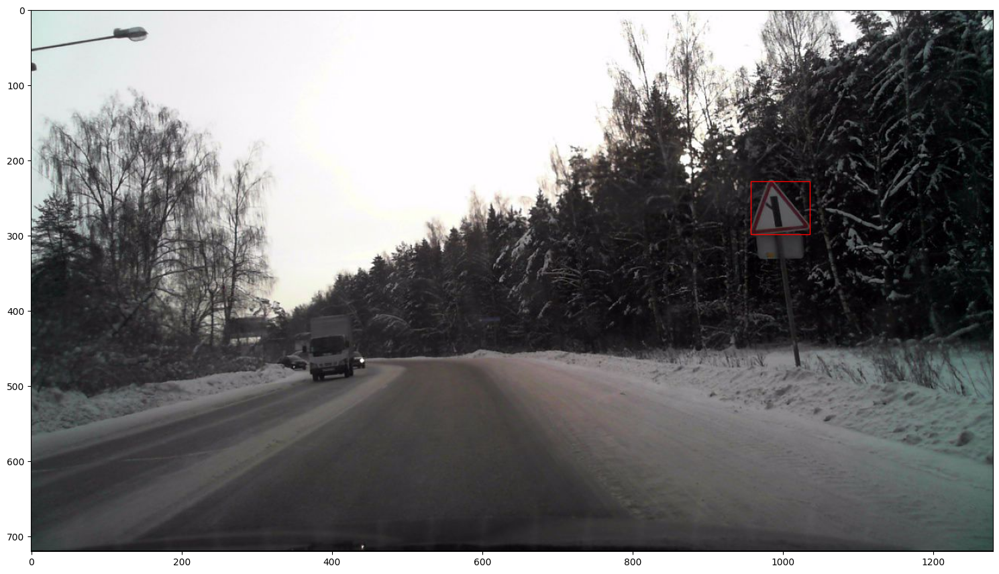

3_33
autosave10_10_2012_14_10_54_1.jpg


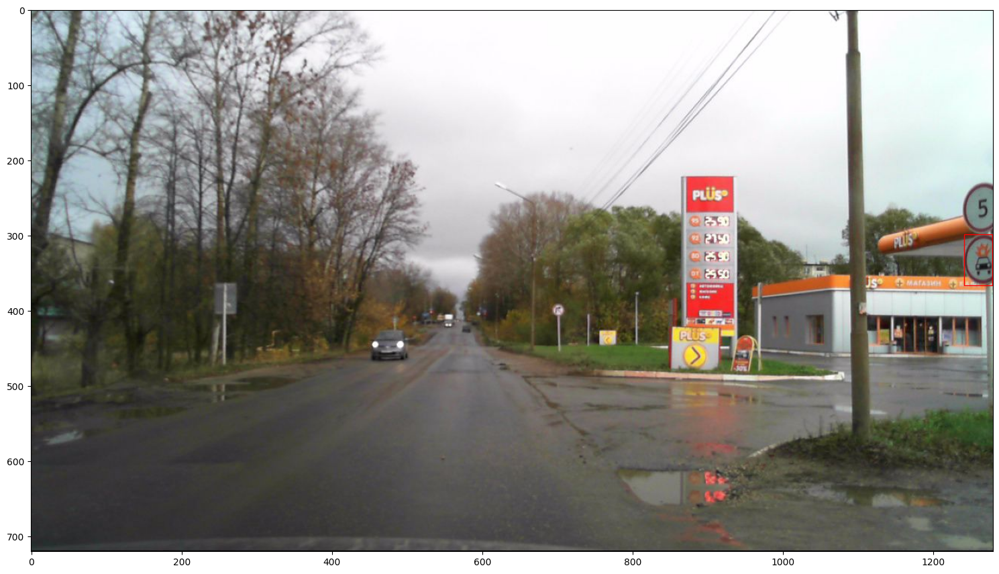

In [17]:
for class_i in files_index_list:
    print(labels['sign_class'][class_i[0]])
    path = '/kaggle/input/rtsd-dataset/rtsd-frames/rtsd-frames/'+ labels.filename[class_i[0]]
    print(labels.filename[class_i[0]])
    make_marking(class_i[0])

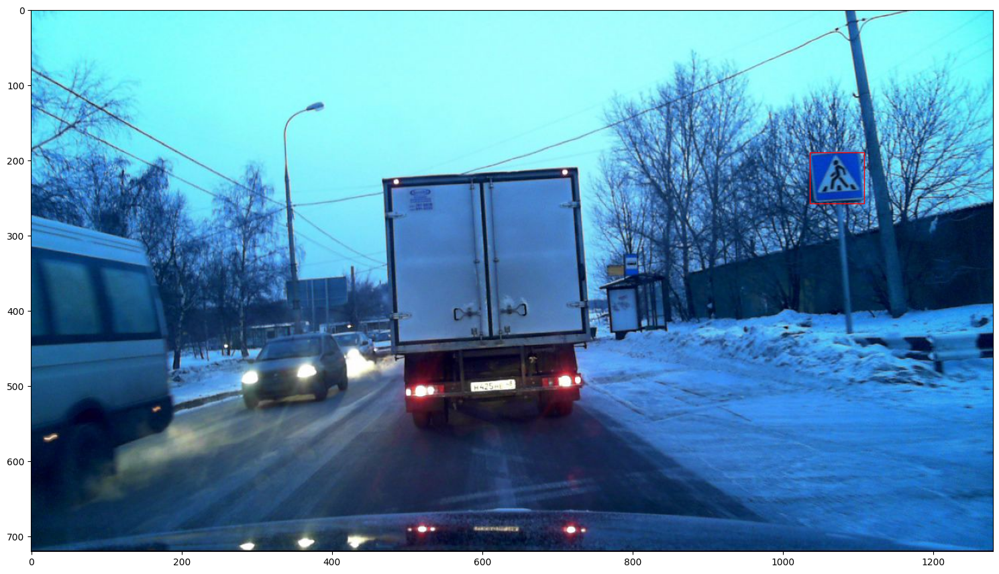

In [18]:
make_marking(labels.loc[labels.sign_class=='5_19_1'].index[20])

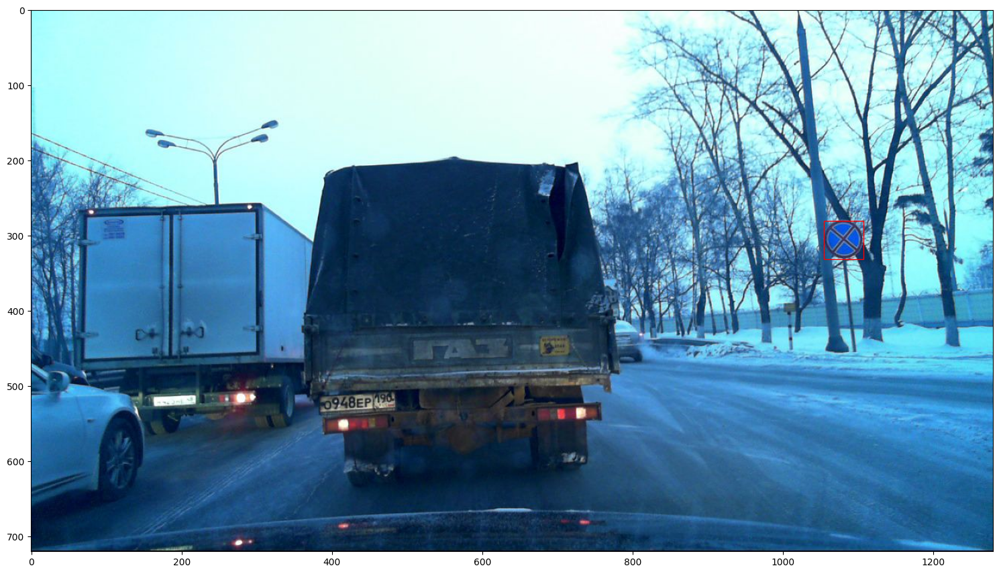

In [19]:
make_marking(labels.loc[labels.sign_class=='3_27'].index[20])

In [20]:
def make_marking_rects(indices, columns):
    rows = 198 // columns
    fig, axs = plt.subplots(rows, columns, figsize=(25, 25))
    fig.subplots_adjust(hspace=0.7)
    
    for i, idx in enumerate(indices):
        row, col = divmod(i, columns)
        ax = axs[row, col]
        
        im_labels = labels.iloc[idx]
        im = Image.open(root_path + im_labels.filename)
        
        x_min, y_min = im_labels.x_from, im_labels.y_from
        x_max, y_max = x_min + im_labels.width, y_min + im_labels.height

        ax.imshow(im)
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.axis('off')
    
    plt.show()

In [21]:
unique_classes = labels['sign_class'].unique()
selected_indices = []

for class_value in unique_classes:
    class_indices = labels[labels['sign_class'] == class_value].index
    random_index = np.random.choice(class_indices, size=1, replace=False)
    selected_indices.append(int(random_index))

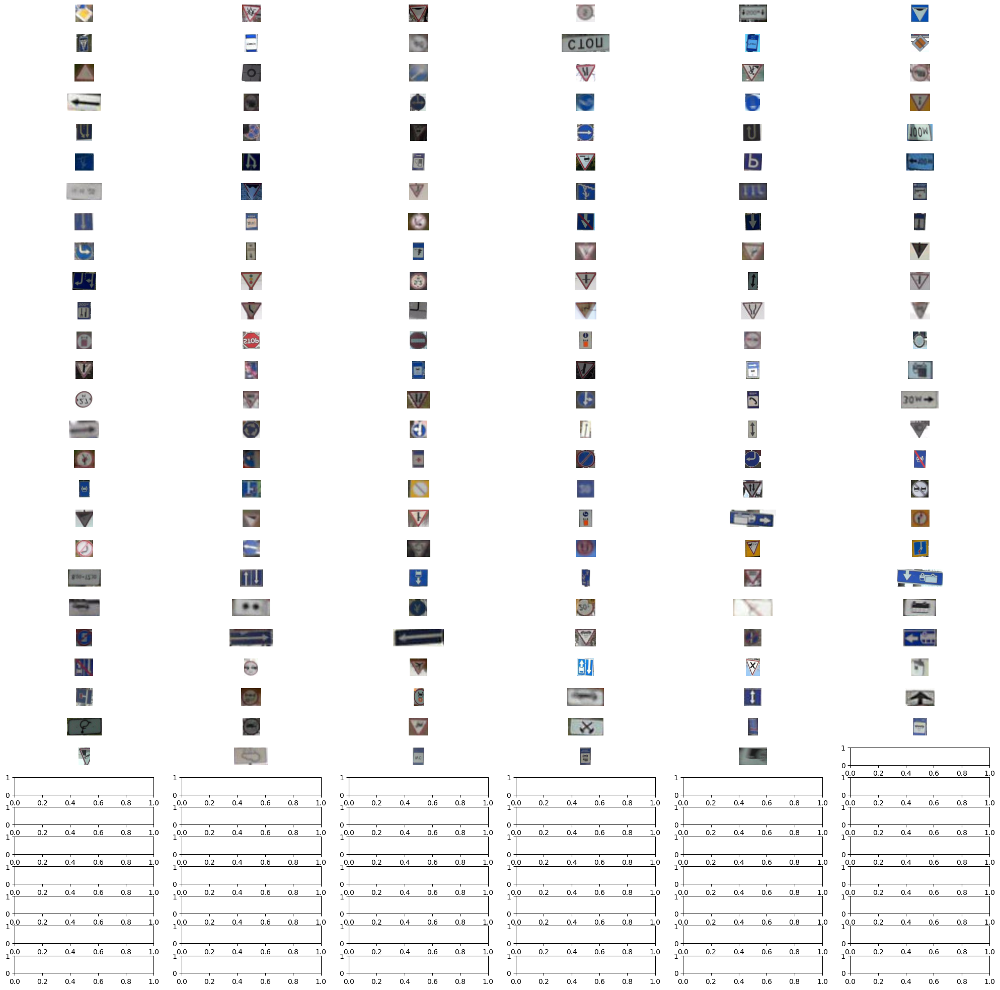

In [22]:
make_marking_rects(selected_indices, columns=6)

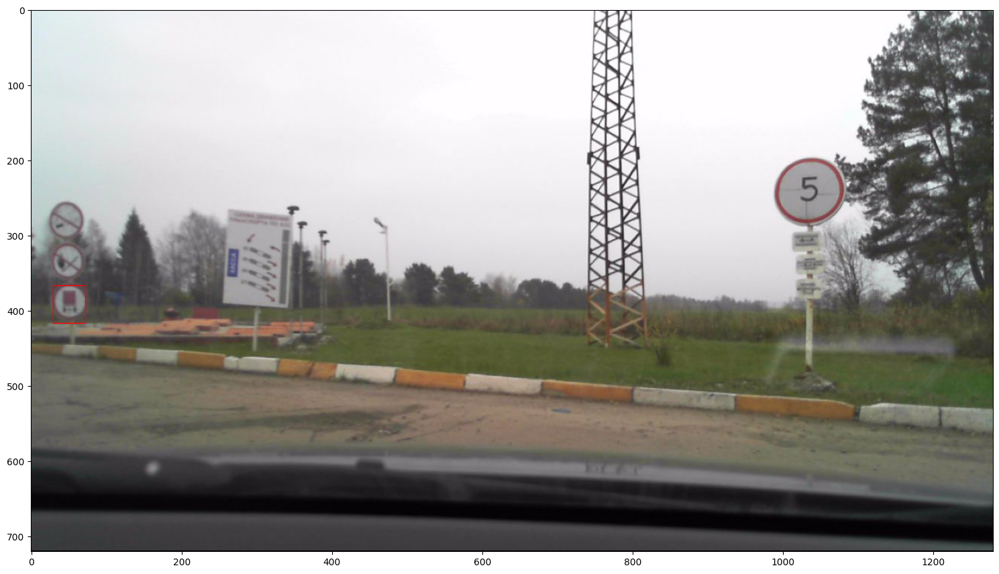

In [23]:
make_marking(selected_indices[66])

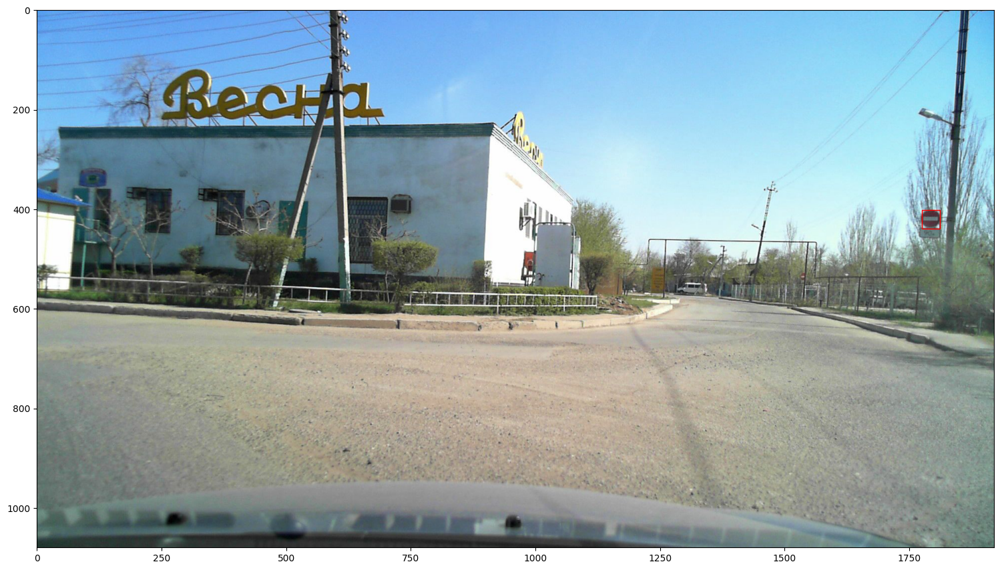

In [24]:
make_marking(selected_indices[68])

## Классификатор ResNet

In [25]:
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from tqdm.auto import tqdm
import torch
import torchvision.models as models
import torch.nn as nn
from sklearn.metrics import classification_report
from torch.nn import functional as F

Так как в качестве sign_class у нас представлена строка, необходимо ее преобразовать в какое-то числовое значение. Для этого было сделано сопоставление к каждой уникальной строке уникального числа. Так как уникальных строк 198, то и уникальных значений class получилось 198. Сопоставление реализованы как словарь.

In [26]:
class_mapping = {class_name: class_id for class_id, class_name in enumerate(labels['sign_class'].unique())}
labels['class'] = labels['sign_class'].map(class_mapping)

In [27]:
x_train, x_test, y_train, y_test = train_test_split(labels[['filename','x_from', 'y_from', 'width', 'height']], labels['class'], random_state=42)

In [28]:
class CustomDataset(Dataset):
    def __init__(self, data, targets, root_path, transform=None):
        self.data = data
        self.targets = targets
        self.root_path = root_path
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
   
        x = self.data.iloc[index]
        y = self.targets.iloc[index]

        # Загрузка изображения и вырезание участка
        image_path = self.root_path + x['filename']
        
        image = Image.open(image_path)
        cropped_image = image.crop((x['x_from'], x['y_from'], x['x_from'] + x['width'], x['y_from'] + x['height']))
        
        if self.transform:
            cropped_image = self.transform(cropped_image)

        return cropped_image, y


In [29]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Размер, который ожидает ResNet
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Нормализация для ResNet
])

# Создание Dataset и DataLoader для тренировочных данных

train_dataset = CustomDataset(data=x_train, targets=y_train, root_path=root_path, transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True)

# Аналогично для тестовых данных
test_dataset = CustomDataset(data=x_test, targets=y_test, root_path=root_path, transform=transform)
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=False)


In [32]:
resnet = models.resnet101(pretrained=True)

/home/stas/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.

Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /home/stas/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth


  0%|          | 0.00/171M [00:00<?, ?B/s]

In [33]:
num_classes = 198
resnet.fc = nn.Linear(resnet.fc.in_features, num_classes)

# Заморозка весов предварительно обученных слоев
for param in resnet.parameters():
    param.requires_grad = False
# Разморозка весов последнего слоя
for param in resnet.fc.parameters():
    param.requires_grad = True
    
# Определение функции потерь и оптимизатора
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet.fc.parameters())

num_epochs = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet.to(device)

num_training_steps = num_epochs * len(train_dataloader)

In [34]:
def model_predictions(model, loader):
    real_target, pred_target = [], []
    resnet.to(device)

    resnet.to(device)

    for X, Y in loader:
        X, Y = X.to(device), Y.to(device)
        pred = model(X)
        pred_target.append(pred)
        real_target.append(Y)
    pred_target, real_target = torch.cat(pred_target), torch.cat(real_target)

    return real_target.detach().cpu().numpy(), F.softmax(pred_target, dim=-1).argmax(dim=-1).cpu().detach().numpy()

In [35]:
progress_bar = tqdm(range(num_training_steps))
for epoch in range(num_epochs):
    resnet.train()
    running_loss = 0.0
    
    for xb, yb in train_dataloader:
        xb, yb = xb.to(device), yb.to(device)  
        
        outputs = resnet(xb)
        loss = criterion(outputs, yb)
        optimizer.zero_grad()  
        
        loss.backward()  
        optimizer.step()  
        
        progress_bar.update(1)
        running_loss += loss.item()

    epoch_loss = running_loss / len(train_dataloader)
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss}")

    resnet.eval()
    correct = 0
    total = 0
    
    with torch.no_grad():
        for xb, yb in test_dataloader:
            xb, yb = xb.to(device), yb.to(device)
            outputs = resnet(xb)
            _, predicted = torch.max(outputs.data, 1)
            total += yb.size(0)
            correct += (predicted == yb).sum().item()
    accuracy = correct / total
    print(f"Test Accuracy: {accuracy}")

  0%|          | 0/12230 [00:00<?, ?it/s]

Epoch 1/10, Loss: 1.1068548281857544
Test Accuracy: 0.8123035645841319
Epoch 2/10, Loss: 0.6218664407096529
Test Accuracy: 0.8426983518589498
Epoch 3/10, Loss: 0.5291592353134007
Test Accuracy: 0.8446531238022231
Epoch 4/10, Loss: 0.4810249208794786
Test Accuracy: 0.8509390571100038
Epoch 5/10, Loss: 0.44016059805454044
Test Accuracy: 0.8531621310847067
Epoch 6/10, Loss: 0.41024500535510156
Test Accuracy: 0.8652740513606746
Epoch 7/10, Loss: 0.3834406970006369
Test Accuracy: 0.8668838635492526
Epoch 8/10, Loss: 0.36151500659113717
Test Accuracy: 0.8716749712533538
Epoch 9/10, Loss: 0.348016131331174
Test Accuracy: 0.8729014948256036
Epoch 10/10, Loss: 0.33242065253578434
Test Accuracy: 0.880068991950939


In [36]:
real_target, pred_target = model_predictions(resnet, test_dataloader)

In [37]:
print(classification_report(real_target, pred_target))

              precision    recall  f1-score   support

           0       0.95      1.00      0.97      2788
           1       0.79      0.83      0.81       718
           2       0.89      0.76      0.82       302
           3       0.91      0.95      0.93      1049
           4       0.87      0.90      0.89       239
           5       0.98      0.76      0.86       507
           6       0.94      0.98      0.96      5999
           7       0.96      0.96      0.96      1309
           8       0.90      0.61      0.73        44
           9       0.90      0.96      0.93       271
          10       0.00      0.00      0.00         6
          11       1.00      0.51      0.68       141
          12       0.95      0.96      0.96      1035
          13       0.70      0.90      0.79        39
          14       0.90      0.80      0.85       290
          15       1.00      0.04      0.08        24
          16       0.83      0.50      0.62       286
          17       0.30    

/home/stas/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/home/stas/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/home/stas/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [38]:
torch.save(resnet, 'classification_model_resnet101.pt')